# Set Up

In [218]:
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

# Make numpy values easier to read.
np.set_printoptions(precision=3, suppress=True)

import tensorflow as tf
from tensorflow.keras import layers

In [219]:
path = ('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/final_dataset_v2_no_NA.csv')

# Dataset

In [220]:
df = pd.read_csv(path)
df.head()

,Unnamed: 0,area_name,property_id,property_name,property_bedrooms,property_type,unit_id,unit_name,unit_type,bedroom,...,tv,ac,parking,pool,breakfast,building_staff,status,price_per_unit,total_bookings,overall_rating
0,0,Bingin,PR0057,Teges Asri,7,Guesthouse,UN1395,Room 1,Standard,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.170735e+06,138.0,4.702576
1,1,Bingin,PR0057,Teges Asri,7,Guesthouse,UN1396,Room 2,Standard,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.201892e+06,143.0,4.824885
2,2,Bingin,PR0057,Teges Asri,7,Guesthouse,UN1397,Room 3,Standard,1.0,...,0.0,1.0,1.0,1.0,0.0,1.0,1,1.237458e+06,147.0,4.674419
3,3,Bingin,PR0057,Teges Asri,7,Guesthouse,UN1398,Room 4,Standard,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.195869e+06,130.0,4.810275
4,4,Bingin,PR0057,Teges Asri,7,Guesthouse,UN1399,Room 5,Standard,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.189912e+06,130.0,4.794189


In [221]:
# df['property_type'].unique()

In [222]:
# df['area_name'].unique()

# EDA & Preprocessing

In [223]:
#df = df.dropna()

In [224]:
#df.to_csv('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/final_dataset_v2_no_NA.csv')

In [225]:
property_type = df['property_type']
unit_type = df['unit_type']
area_name = df['area_name']
unit = df['unit_id']

In [226]:
# df.set_index('unit_id', inplace=True)

In [227]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['area_name'] = label_encoder.fit_transform(df['area_name'])
# df['unit_id'] = df['unit_id'].str[2:].astype(int)
df['property_type'] = label_encoder.fit_transform(df['property_type'])
df['unit_type'] = label_encoder.fit_transform(df['unit_type'])
df.head()

,Unnamed: 0,area_name,property_id,property_name,property_bedrooms,property_type,unit_id,unit_name,unit_type,bedroom,...,tv,ac,parking,pool,breakfast,building_staff,status,price_per_unit,total_bookings,overall_rating
0,0,0,PR0057,Teges Asri,7,0,UN1395,Room 1,74,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.170735e+06,138.0,4.702576
1,1,0,PR0057,Teges Asri,7,0,UN1396,Room 2,74,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.201892e+06,143.0,4.824885
2,2,0,PR0057,Teges Asri,7,0,UN1397,Room 3,74,1.0,...,0.0,1.0,1.0,1.0,0.0,1.0,1,1.237458e+06,147.0,4.674419
3,3,0,PR0057,Teges Asri,7,0,UN1398,Room 4,74,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.195869e+06,130.0,4.810275
4,4,0,PR0057,Teges Asri,7,0,UN1399,Room 5,74,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,1,1.189912e+06,130.0,4.794189


In [228]:
# df['property_type'].unique()

In [229]:
# df['area_name'].unique()

In [230]:
# df.columns

In [231]:
df = df[['area_name', 'property_type', # 'unit_type',
         'price_per_unit','overall_rating','bedroom',
         'bathroom', 'beds', 'tv', 'wifi', 'ac','parking',
         'pool', 'breakfast','building_staff']]
df.head()

,area_name,property_type,price_per_unit,overall_rating,bedroom,bathroom,beds,tv,wifi,ac,parking,pool,breakfast,building_staff
0,0,0,1.170735e+06,4.702576,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
1,0,0,1.201892e+06,4.824885,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
2,0,0,1.237458e+06,4.674419,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0
3,0,0,1.195869e+06,4.810275,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
4,0,0,1.189912e+06,4.794189,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0


In [232]:
#df.describe()

In [233]:
# df['property_type'].value_counts()

0 : 'Guesthouse',
4 : 'Villa',
1 : 'Hostel',
3 : 'Resort',
2 : 'House'

In [234]:
# sns.pairplot(df, hue='property_type')

In [235]:
# sns.pairplot(df)

In [236]:
# df = df.drop(column='')

In [237]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 331 entries, 0 to 330
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   area_name       331 non-null    int64  
 1   property_type   331 non-null    int64  
 2   price_per_unit  331 non-null    float64
 3   overall_rating  331 non-null    float64
 4   bedroom         331 non-null    float64
 5   bathroom        331 non-null    float64
 6   beds            331 non-null    float64
 7   tv              331 non-null    float64
 8   wifi            331 non-null    float64
 9   ac              331 non-null    float64
 10  parking         331 non-null    float64
 11  pool            331 non-null    float64
 12  breakfast       331 non-null    float64
 13  building_staff  331 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 36.3 KB


In [238]:
df['price_per_unit'] = (df['price_per_unit']  - df['price_per_unit'].min())/(df['price_per_unit'].max() - df['price_per_unit'].min())
#df['total_bookings'] = (df['total_bookings']  - df['total_bookings'].min())/(df['total_bookings'].max() - df['total_bookings'].min())
df['overall_rating'] = (df['overall_rating']  - df['overall_rating'].min())/(df['overall_rating'].max() - df['overall_rating'].min())

df['bedroom'] = (df['bedroom']  - df['bedroom'].min())/(df['bedroom'].max() - df['bedroom'].min())
df['bathroom'] = (df['bathroom']  - df['bathroom'].min())/(df['bathroom'].max() - df['bathroom'].min())
df['beds'] = (df['beds']  - df['beds'].min())/(df['beds'].max() - df['beds'].min())

df['area_name'] = (df['area_name']  - df['area_name'].min())/(df['area_name'].max() - df['area_name'].min())
#df['unit_type'] = (df['unit_type']  - df['unit_type'].min())/(df['unit_type'].max() - df['unit_type'].min())
df['property_type'] = (df['property_type']  - df['property_type'].min())/(df['property_type'].max() - df['property_type'].min())
#df['property_bedrooms'] = (df['property_bedrooms']  - df['property_bedrooms'].min())/(df['property_bedrooms'].max() - df['property_bedrooms'].min())

df.head()

,area_name,property_type,price_per_unit,overall_rating,bedroom,bathroom,beds,tv,wifi,ac,parking,pool,breakfast,building_staff
0,0.0,0.0,0.154179,0.791803,0.0,0.2,0.2,0.0,1.0,1.0,1.0,1.0,0.0,0.0
1,0.0,0.0,0.159478,0.877419,0.0,0.2,0.2,0.0,1.0,1.0,1.0,1.0,0.0,0.0
2,0.0,0.0,0.165527,0.772093,0.0,0.2,0.2,0.0,1.0,1.0,1.0,1.0,0.0,1.0
3,0.0,0.0,0.158453,0.867192,0.0,0.2,0.2,0.0,1.0,1.0,1.0,1.0,0.0,0.0
4,0.0,0.0,0.157440,0.855932,0.0,0.2,0.2,0.0,1.0,1.0,1.0,1.0,0.0,0.0


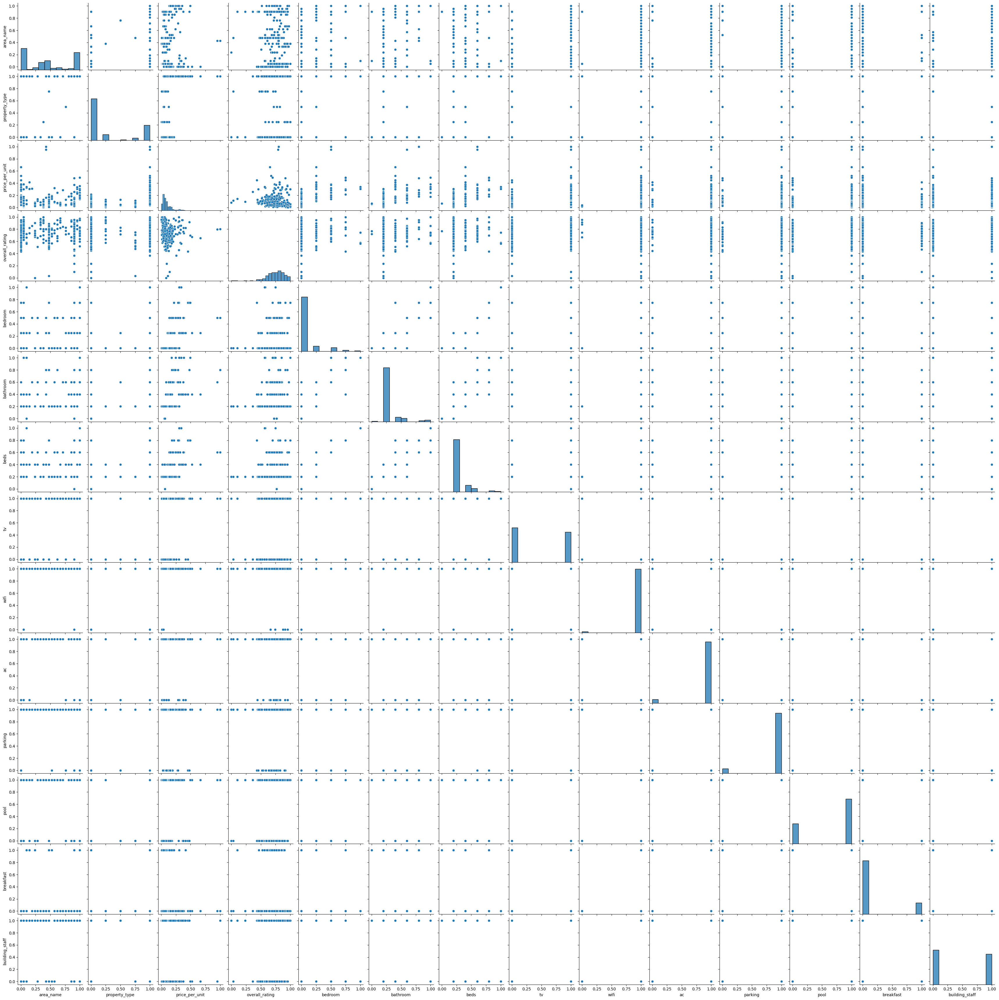

In [239]:
sns.pairplot(df)

In [240]:
# df['breakfast'].value_counts()

Normalisasi

In [241]:
from sklearn.preprocessing import Normalizer, StandardScaler
normal_values = Normalizer().fit_transform(df.values)
print(normal_values)

[[-1.234 -0.672  0.392 ...  0.667 -0.461 -0.938]
 [-1.234 -0.672  0.437 ...  0.667 -0.461 -0.938]
 [-1.234 -0.672  0.489 ...  0.667 -0.461  1.066]
 ...
 [ 1.554  1.695  1.508 ...  0.667 -0.461  1.066]
 [ 1.554  1.695  0.806 ...  0.667 -0.461 -0.938]
 [ 1.554  1.695  0.75  ...  0.667 -0.461 -0.938]]


# PCA

In [242]:
from sklearn.decomposition import PCA

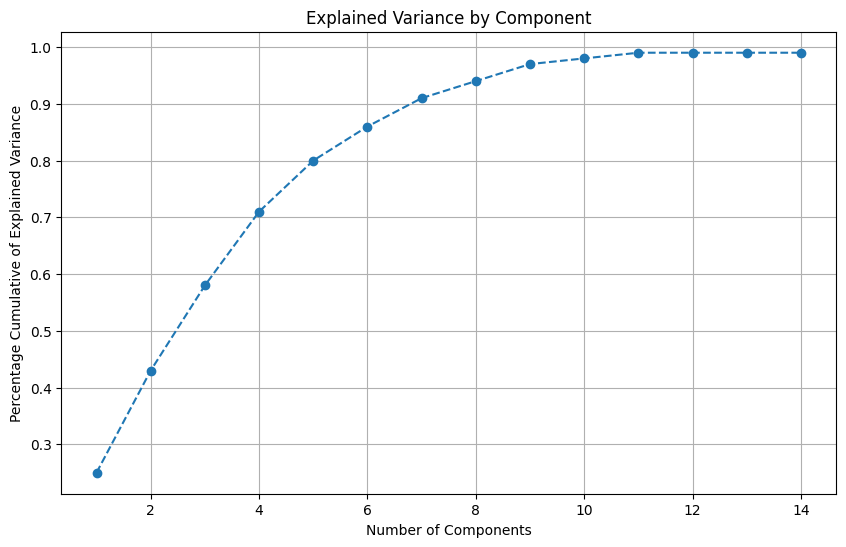

In [243]:
pca = PCA()
pca.fit(df)
per_var = np.round(pca.explained_variance_ratio_, decimals = 2)

plt.figure(figsize = (10,6))
plt.plot(range(1, len(per_var)+1), per_var.cumsum(), marker = "o", linestyle = "--")
plt.grid()
plt.ylabel("Percentage Cumulative of Explained Variance")
plt.xlabel("Number of Components")
plt.title("Explained Variance by Component")
plt.show()

## component = X

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

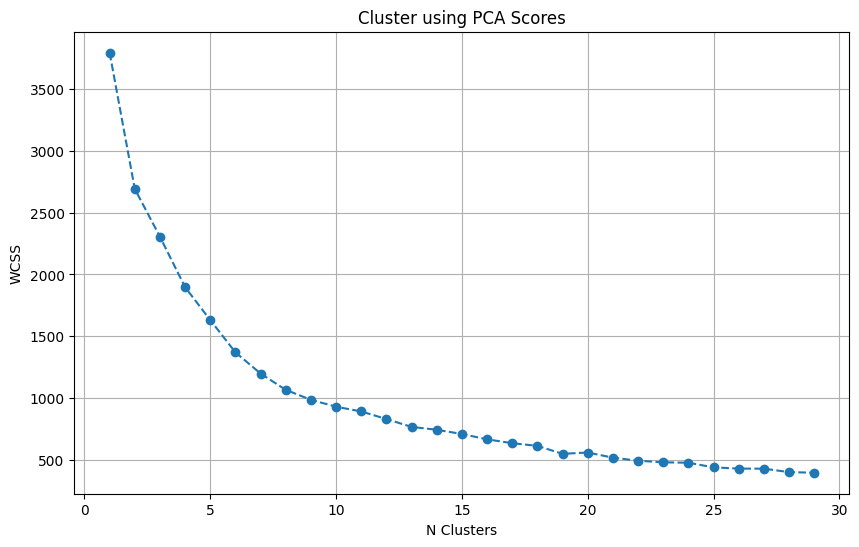

In [244]:
compca = 7

pca = PCA(n_components = compca)
pca.fit(normal_values)
scores_pca = pca.transform(normal_values)

from sklearn.cluster import KMeans
WCSS = []

for i in range(1,30):
  kmeans_pca = KMeans(n_clusters = i, init = "k-means++", random_state = 42)
  kmeans_pca.fit(scores_pca)
  WCSS.append(kmeans_pca.inertia_)

plt.figure(figsize = (10,6))
plt.plot(range(1,30), WCSS, marker = "o", linestyle = "--")
plt.grid()
plt.title("Cluster using PCA Scores")
plt.ylabel("WCSS")
plt.xlabel("N Clusters")
plt.show()

In [245]:
# Extract the absolute values of the PCA loadings
pca_loadings_analysis = pd.DataFrame(
    np.abs(pca.components_),
    columns=df.columns,
    index=[f'PC{i+1}' for i in range(pca.n_components)]
)

# Identify the top contributing features for each principal component
top_features_per_pc = pca_loadings_analysis.apply(lambda s: s.nlargest(5).index.tolist(), axis=1)

# Display the top contributing features for each principal component
pd.DataFrame(top_features_per_pc)

,0
PC1,"[bedroom, beds, bathroom, price_per_unit, prop..."
PC2,"[ac, pool, wifi, parking, building_staff]"
PC3,"[breakfast, area_name, overall_rating, tv, pool]"
PC4,"[wifi, tv, building_staff, overall_rating, ac]"
PC5,"[parking, building_staff, wifi, ac, overall_ra..."
PC6,"[area_name, tv, breakfast, pool, price_per_unit]"
PC7,"[overall_rating, building_staff, breakfast, pr..."


# K-Means

### K = X

In [246]:
comp = ["comp1", "comp2", "comp3", "comp4", "comp5", 'comp6','comp7','comp8','comp9'] #
sub = k = 4

kmeans_k = KMeans(n_clusters = k, init = "k-means++", random_state = 42)
kmeans_k.fit(scores_pca)

df_unit = pd.concat([unit, df], axis = 1)
df_clust_pca_kmeans = pd.concat([df_unit, pd.DataFrame(scores_pca)], axis = 1)
#df_clust_pca_kmeans

# Renaming the column label from each component
df_clust_pca_kmeans.columns.values[-compca:] = comp[:compca]

# Seting the cluster label to each observation, using the atribute .labels_
df_clust_pca_kmeans["segment_kmeans_pca"] = kmeans_k.labels_

# Mapping each cluster segmentation and renaming their labels
df_clust_pca_kmeans["segment"] = df_clust_pca_kmeans["segment_kmeans_pca"].map({0:"Cluster 1", 1:"Cluster 2",
                                                                                    2:"Cluster 3", 3:"Cluster 4",
                                                                                    4:"Cluster 5", 5:"Cluster 6"})

np.round(pd.DataFrame(df_clust_pca_kmeans['segment'].value_counts()) / 331 , 2)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,count
segment,
Cluster 1,0.64
Cluster 2,0.17
Cluster 3,0.14
Cluster 4,0.05


# Result

### PairPlot Features

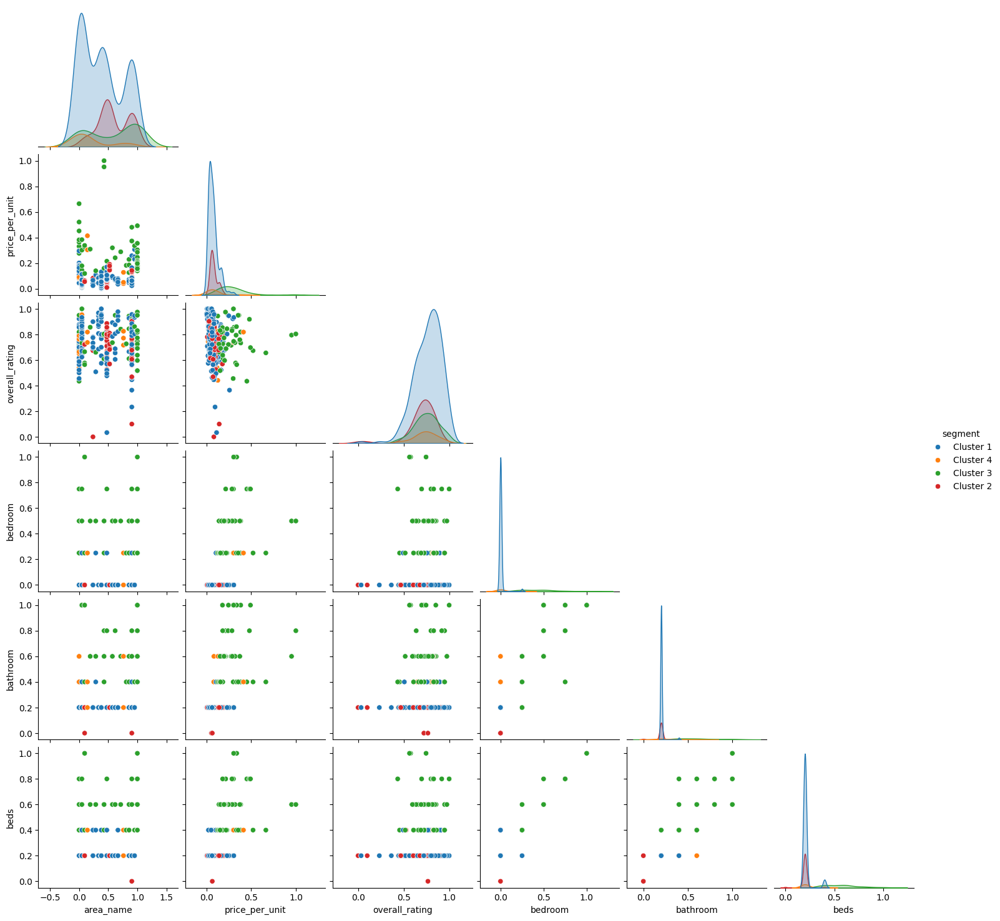

In [247]:
clustca = df_clust_pca_kmeans[['unit_id', 'area_name', 'price_per_unit',
                                 'overall_rating', 'bedroom',
                                 'bathroom', 'beds', 'segment']]
sns.pairplot(clustca, hue='segment', corner = True)

### PairPlot PCA

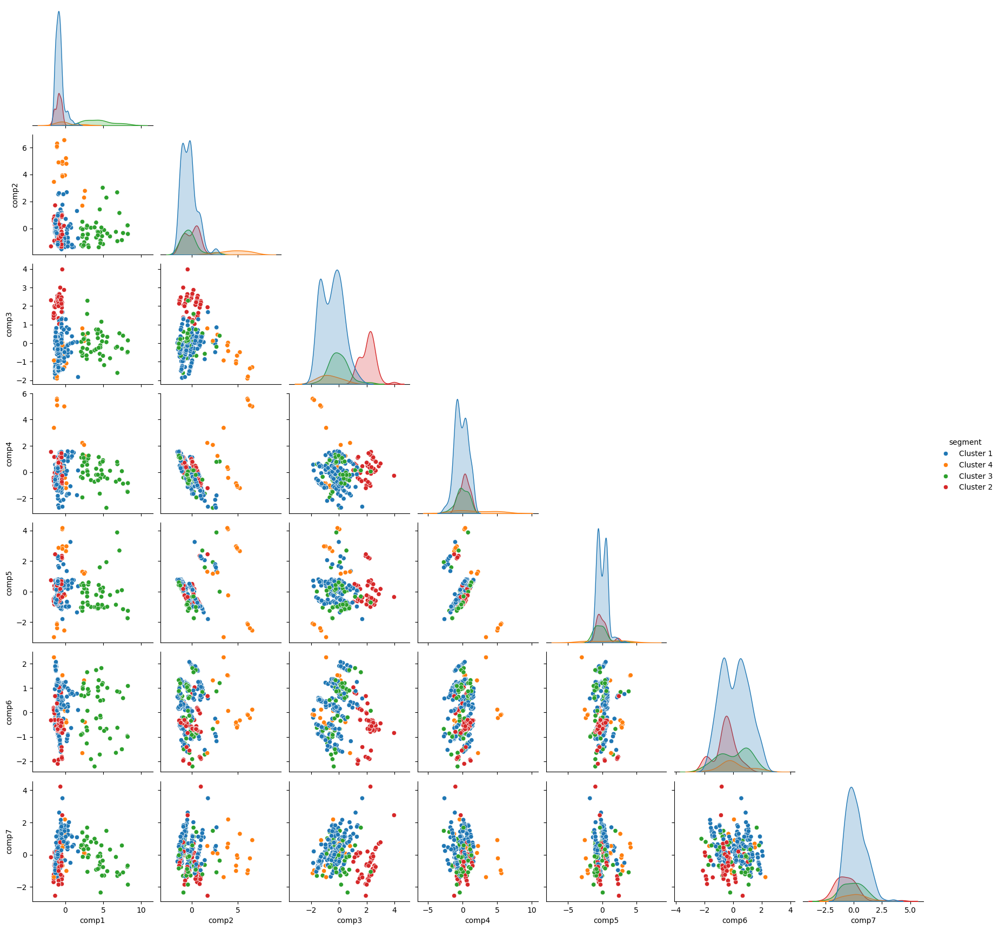

In [248]:
df_clust_pca_kmeans['property_type'] = property_type
df_clust_pca_kmeans['area_name'] = area_name
df_clust_pca_kmeans['unit_type'] = unit_type

dalist = ['segment']
dalist.extend(comp[:compca])

pc66 = df_clust_pca_kmeans[dalist]
sns.pairplot(pc66, hue='segment', corner = True)

### 3D

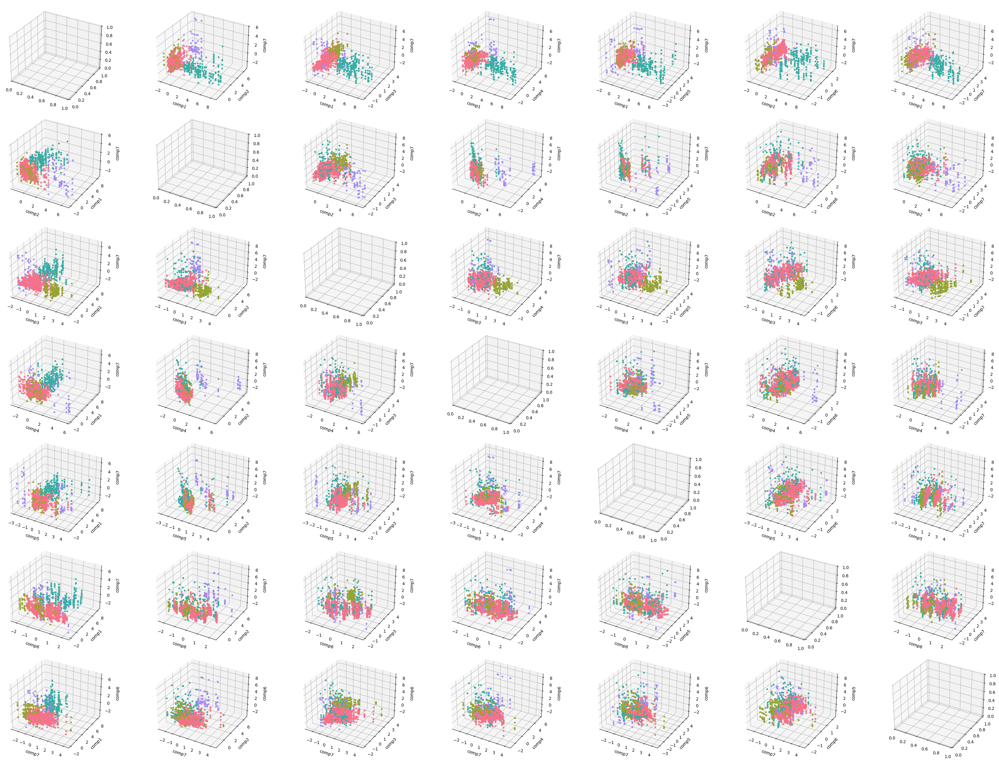

In [249]:
x_cols = comp[:compca]
y_cols = comp[:compca]
z_cols = comp[:compca]

df_clust_pca_kmeans['segment'] = label_encoder.fit_transform(df_clust_pca_kmeans['segment'])
c = df_clust_pca_kmeans['segment']

fig, axs = plt.subplots(compca, compca, figsize=(35, 25), subplot_kw={'projection': '3d'})

# Define color map
cmap = ListedColormap(sns.color_palette("husl", n_colors=len(df_clust_pca_kmeans['segment'].unique())).as_hex())

for i, x_col in enumerate(x_cols):
    for j, y_col in enumerate(y_cols):
        for k, z_col in enumerate(z_cols):
          if x_col != y_col and y_col != z_col and x_col != z_col:
            ax = axs[i, j]
            x = df_clust_pca_kmeans[x_col]
            y = df_clust_pca_kmeans[y_col]
            z = df_clust_pca_kmeans[z_col]
            sc = ax.scatter(x, y, z, s=40, c=c, marker='.', cmap=cmap, alpha=1)
            ax.set_xlabel(x.name)
            ax.set_ylabel(y.name)
            ax.set_zlabel(z.name)

# Add color bar
# fig.colorbar(sc, ax=axs, shrink=0.6, ticks=df_clust_pca_kmeans['segment'].unique())

# Adjust layout
plt.tight_layout()

# save
plt.savefig("scatter_hue", bbox_inches='tight')

### Single 3D

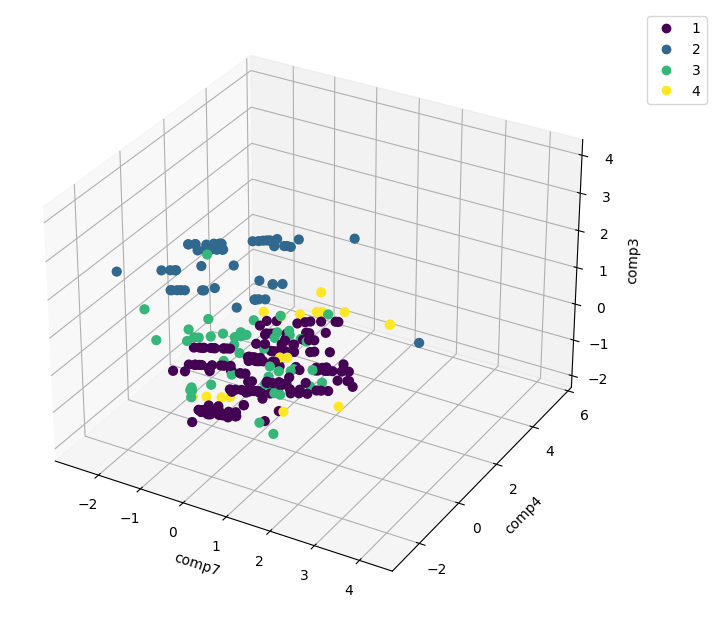

In [250]:
# generate data
x = pd.DataFrame(df_clust_pca_kmeans['comp7'])
y = pd.DataFrame(df_clust_pca_kmeans['comp4'])
z = pd.DataFrame(df_clust_pca_kmeans['comp3'])
df_clust_pca_kmeans['segment'] = label_encoder.fit_transform(df_clust_pca_kmeans['segment']) + 1
c = df_clust_pca_kmeans['segment']


# axes instance
fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
cmap = ListedColormap(sns.color_palette("viridis", 256).as_hex())

# plot
sc = ax.scatter(x, y, z, s=40, c=c, marker='o', cmap=cmap, alpha=1)
ax.set_xlabel(x.columns[0])
ax.set_ylabel(y.columns[0])
ax.set_zlabel(z.columns[0])

# legend
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

# save
plt.savefig("scatter_hue", bbox_inches='tight')

# Save Result

In [251]:
#df_clust_pca_kmeans.to_csv('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/flex/kmeans-7-comp-4-clust.csv')

# EDA Result

In [252]:
result = df_clust_pca_kmeans

In [253]:
result.to_csv('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/flex/kmeans-7-comp-4-clust-clean.csv')

In [254]:
c1 = result[result['segment']==1]
c2 = result[result['segment']==2]
c3 = result[result['segment']==3]
c4 = result[result['segment']==4]

In [255]:
c1.describe()

,price_per_unit,overall_rating,bedroom,bathroom,beds,tv,wifi,ac,parking,pool,...,building_staff,comp1,comp2,comp3,comp4,comp5,comp6,comp7,segment_kmeans_pca,segment
count,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.0,211.0,211.000000,211.000000,...,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.0,211.0
mean,0.072783,0.764062,0.004739,0.202844,0.211374,0.289100,1.0,1.0,0.962085,0.763033,...,0.488152,-0.752158,-0.311345,-0.492152,-0.192007,-0.014501,0.124995,0.175165,0.0,1.0
std,0.054060,0.148676,0.034175,0.023734,0.046430,0.454422,0.0,0.0,0.191444,0.426233,...,0.501048,0.543276,0.817965,0.767327,0.932872,0.731158,0.938300,0.832066,0.0,0.0
min,0.000000,0.033333,0.000000,0.200000,0.200000,0.000000,1.0,1.0,0.000000,0.000000,...,0.000000,-1.366138,-1.550474,-1.866060,-2.707359,-1.795540,-1.608638,-1.358799,0.0,1.0
25%,0.031831,0.672984,0.000000,0.200000,0.200000,0.000000,1.0,1.0,1.000000,1.000000,...,0.000000,-1.083113,-0.991769,-1.251619,-0.874883,-0.591511,-0.568519,-0.442235,0.0,1.0
50%,0.062262,0.789091,0.000000,0.200000,0.200000,0.000000,1.0,1.0,1.000000,1.000000,...,0.000000,-0.864106,-0.293284,-0.446575,-0.209140,0.009910,0.224500,0.012611,0.0,1.0
75%,0.092887,0.871728,0.000000,0.200000,0.200000,1.000000,1.0,1.0,1.000000,1.000000,...,1.000000,-0.578404,0.030687,0.060300,0.529219,0.528860,0.859630,0.639010,0.0,1.0
max,0.305704,1.000000,0.250000,0.400000,0.400000,1.000000,1.0,1.0,1.000000,1.000000,...,1.000000,1.696374,2.677377,1.677202,1.586856,3.255670,2.068531,3.509540,0.0,1.0


In [256]:
result.columns

Index(['unit_id', 'area_name', 'property_type', 'price_per_unit',
       'overall_rating', 'bedroom', 'bathroom', 'beds', 'tv', 'wifi', 'ac',
       'parking', 'pool', 'breakfast', 'building_staff', 'comp1', 'comp2',
       'comp3', 'comp4', 'comp5', 'comp6', 'comp7', 'segment_kmeans_pca',
       'segment', 'unit_type'],
      dtype='object')

<Axes: >

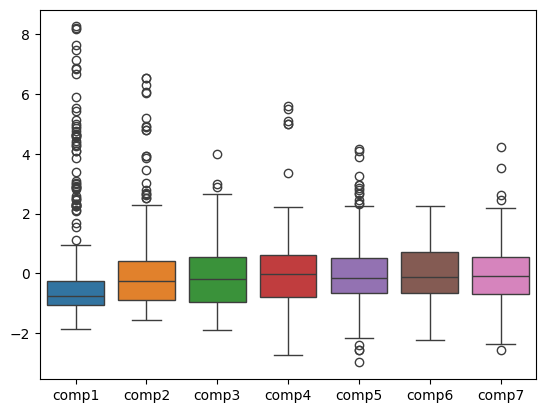

In [257]:
sns.boxplot(result[comp[:compca]])

In [258]:
result = result[result['comp7'] < 0.2]
result = result[result['comp7'] > -0.23]
result = result[result['comp6'] < 0.17]
result = result[result['comp6'] > -0.25]
result = result[result['comp3'] < 0.4]


In [259]:
len(result)

3

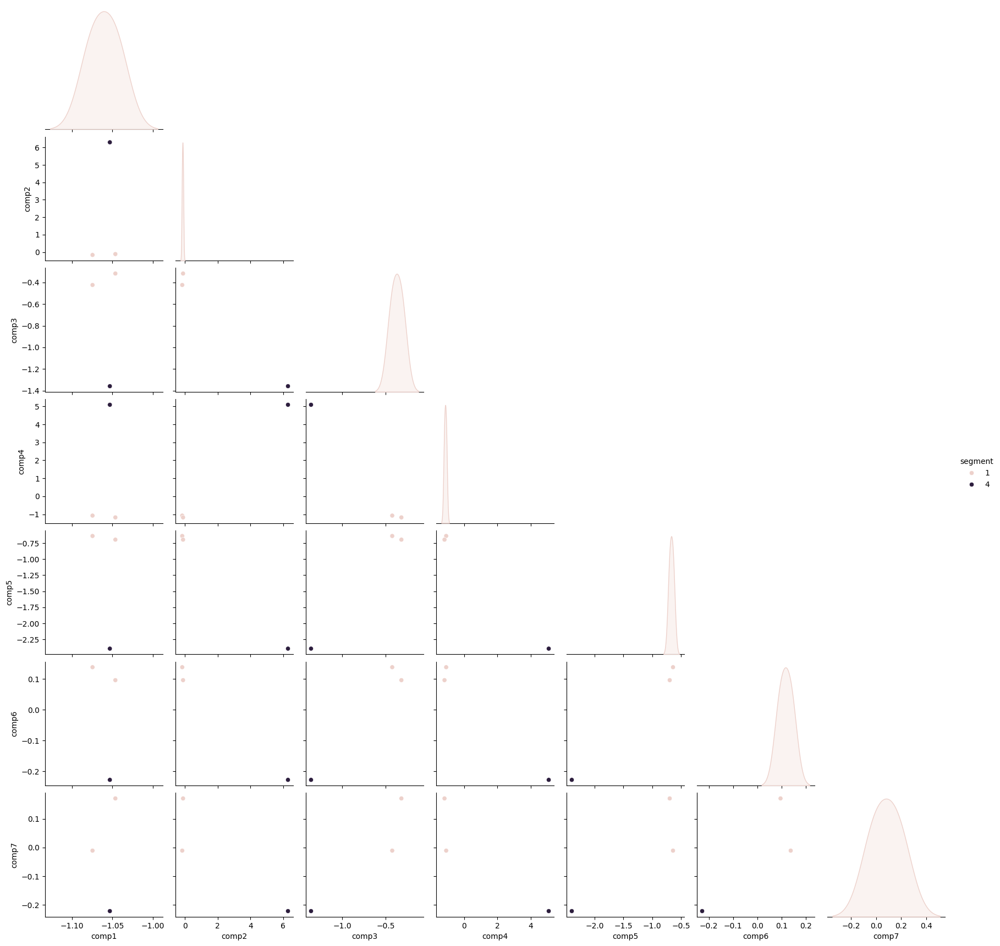

In [260]:
sns.pairplot(result[dalist], hue='segment', corner=True)

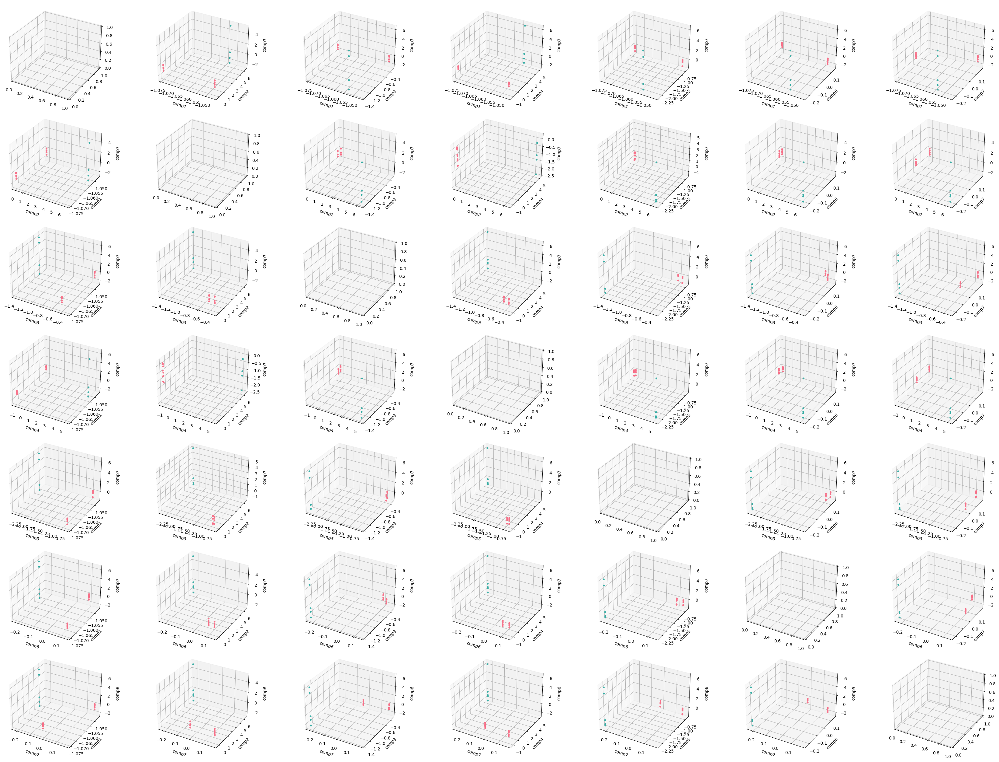

In [261]:
x_cols = comp[:compca]
y_cols = comp[:compca]
z_cols = comp[:compca]

result['segment'] = label_encoder.fit_transform(result['segment'])
c = result['segment']

fig, axs = plt.subplots(compca, compca, figsize=(35, 25), subplot_kw={'projection': '3d'})

# Define color map
cmap = ListedColormap(sns.color_palette("husl", n_colors=len(result['segment'].unique())).as_hex())

for i, x_col in enumerate(x_cols):
    for j, y_col in enumerate(y_cols):
        for k, z_col in enumerate(z_cols):
          if x_col != y_col and y_col != z_col and x_col != z_col:
            ax = axs[i, j]
            x = result[x_col]
            y = result[y_col]
            z = result[z_col]
            sc = ax.scatter(x, y, z, s=40, c=c, marker='.', cmap=cmap, alpha=1)
            ax.set_xlabel(x.name)
            ax.set_ylabel(y.name)
            ax.set_zlabel(z.name)

# Add color bar
# fig.colorbar(sc, ax=axs, shrink=0.6, ticks=df_clust_pca_kmeans['segment'].unique())

# Adjust layout
plt.tight_layout()

# save
plt.savefig("scatter_hue", bbox_inches='tight')

<Axes: >

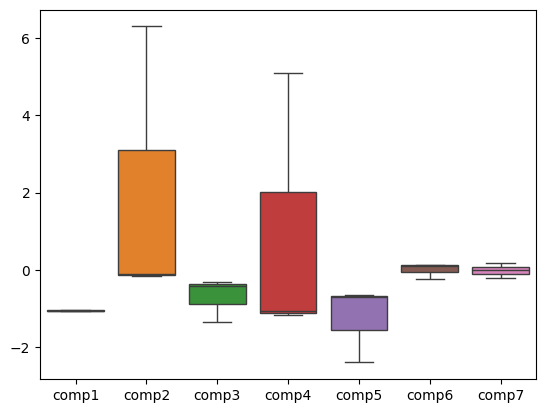

In [262]:
sns.boxplot(result[comp[:compca]])

<Axes: xlabel='segment', ylabel='comp1'>

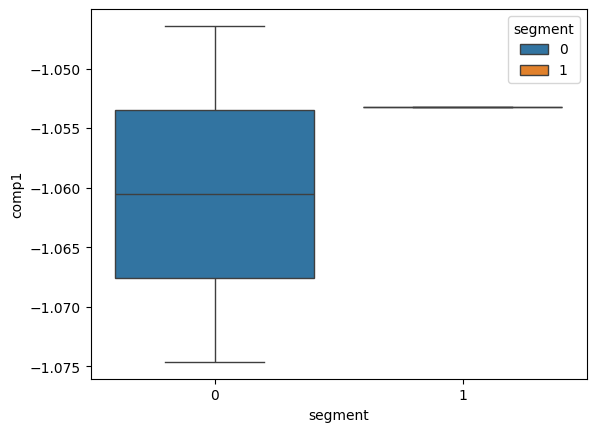

In [263]:
sns.boxplot(result, y = 'comp1', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp2'>

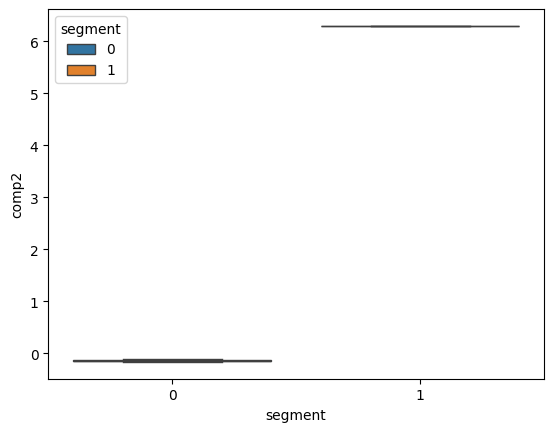

In [264]:
sns.boxplot(result, y = 'comp2', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp3'>

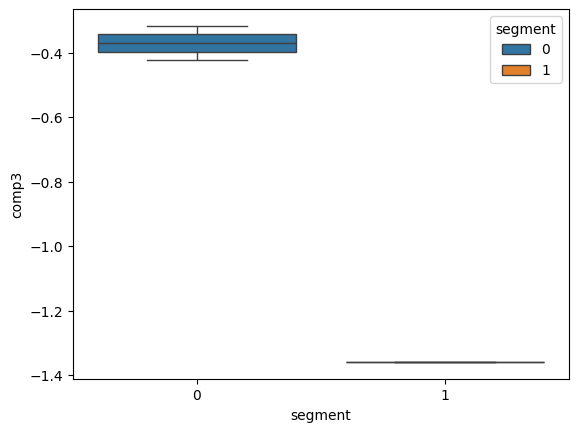

In [265]:
sns.boxplot(result, y = 'comp3', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp4'>

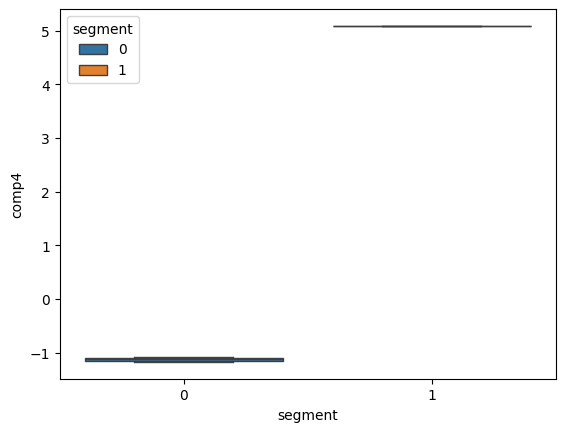

In [266]:
sns.boxplot(result, y = 'comp4', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp5'>

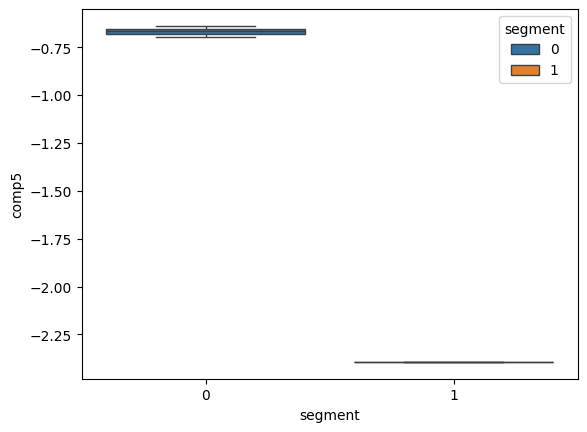

In [267]:
sns.boxplot(result, y = 'comp5', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp6'>

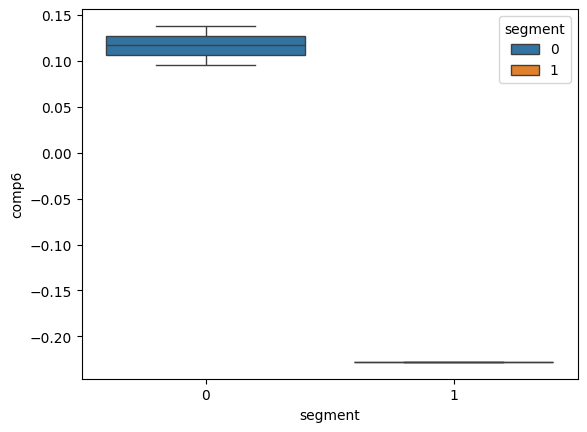

In [268]:
sns.boxplot(result, y = 'comp6', x='segment', hue='segment')

<Axes: xlabel='segment', ylabel='comp7'>

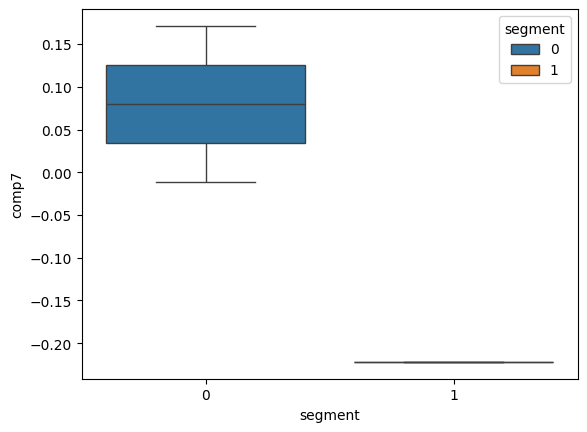

In [269]:
sns.boxplot(result, y = 'comp7', x='segment', hue='segment')

In [270]:
result2 = result[result['comp7'] < 0.25]
result2 = result2[result2['comp7'] > -0.3]
result2 = result2[result2['comp6'] < 0.18]
result2 = result2[result2['comp6'] > -0.2]
result2 = result2[result2['comp5'] > -0.3]
result2 = result2[result2['comp4'] < 0.4]
result2 = result2[result2['comp3'] < 0.5]
result2 = result2[result2['comp1'] < 0.45]

In [271]:
len(result2)

0

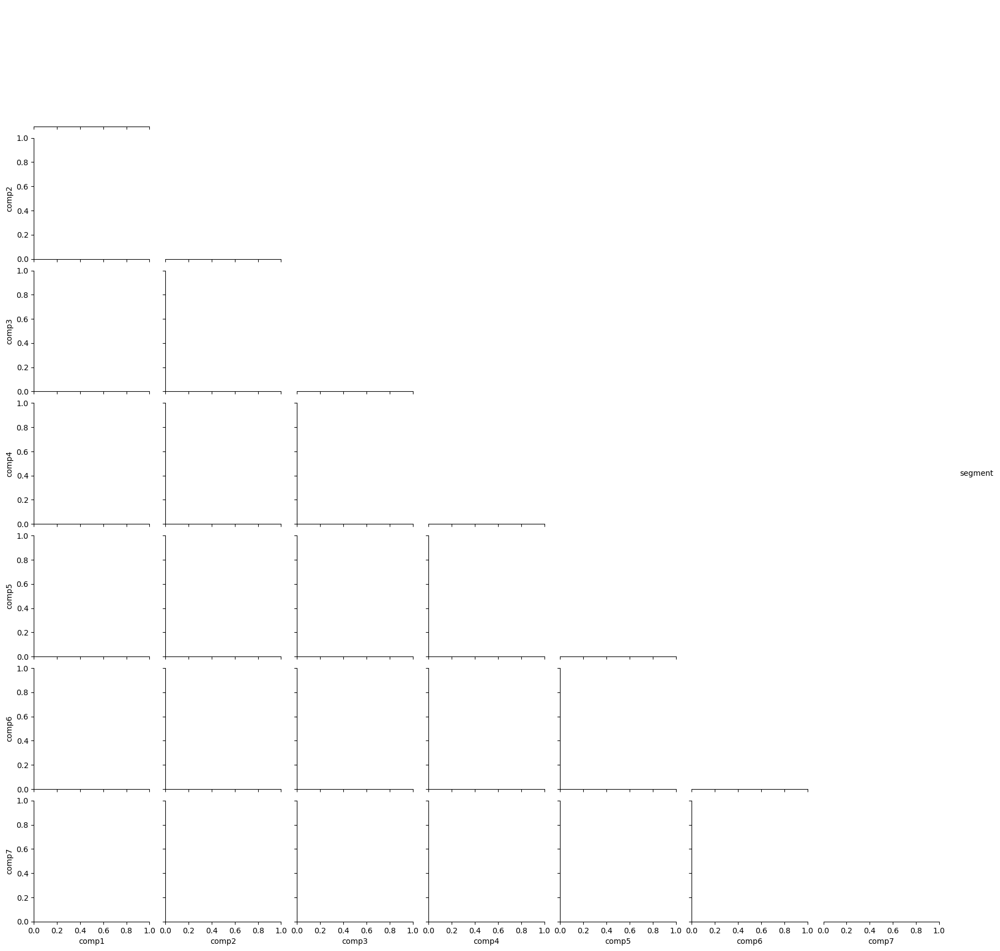

In [272]:
sns.pairplot(result2[dalist], hue='segment', corner=True)

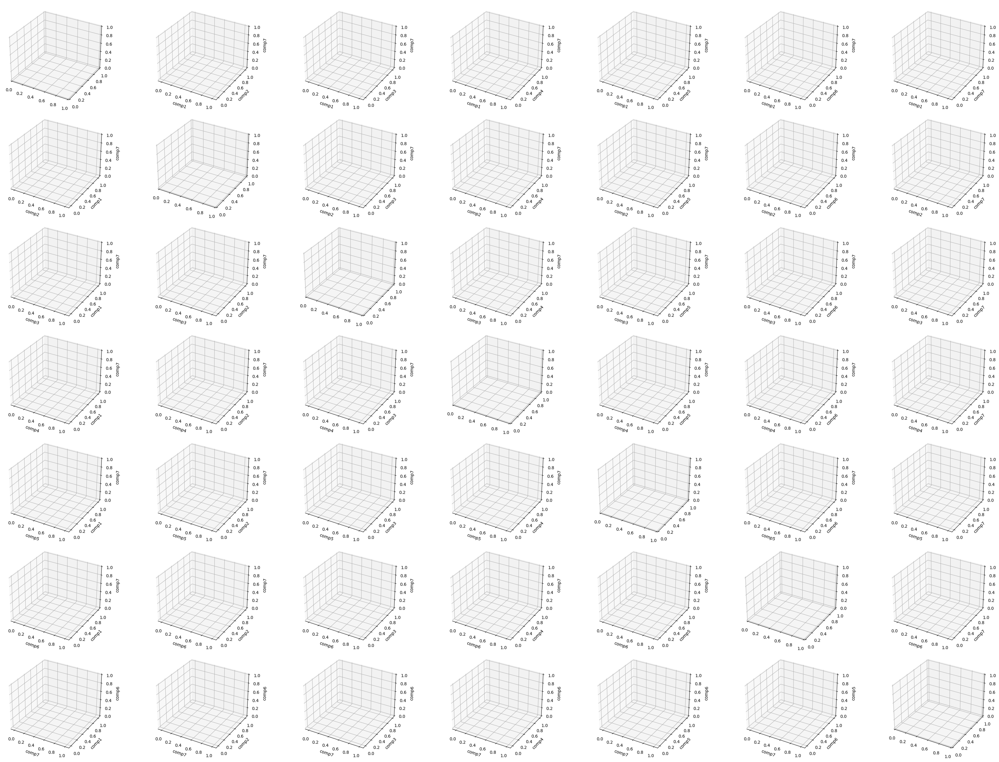

In [273]:
x_cols = comp[:compca]
y_cols = comp[:compca]
z_cols = comp[:compca]

result2['segment'] = label_encoder.fit_transform(result2['segment'])
c = result2['segment']

fig, axs = plt.subplots(compca, compca, figsize=(35, 25), subplot_kw={'projection': '3d'})

# Define color map
cmap = ListedColormap(sns.color_palette("husl", n_colors=len(result2['segment'].unique())).as_hex())

for i, x_col in enumerate(x_cols):
    for j, y_col in enumerate(y_cols):
        for k, z_col in enumerate(z_cols):
          if x_col != y_col and y_col != z_col and x_col != z_col:
            ax = axs[i, j]
            x = result2[x_col]
            y = result2[y_col]
            z = result2[z_col]
            sc = ax.scatter(x, y, z, s=40, c=c, marker='.', cmap=cmap, alpha=1)
            ax.set_xlabel(x.name)
            ax.set_ylabel(y.name)
            ax.set_zlabel(z.name)

# Add color bar
# fig.colorbar(sc, ax=axs, shrink=0.6, ticks=df_clust_pca_kmeans['segment'].unique())

# Adjust layout
plt.tight_layout()

# save
plt.savefig("scatter_hue", bbox_inches='tight')

In [274]:
result.to_csv('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/flex/kmeans-7-comp-4-clust-clean-no-outlier1.csv')
result2.to_csv('drive/MyDrive/Colab Notebooks/Cluster Bukit Vista/flex/kmeans-7-comp-4-clust-clean-no-outlier2.csv')